In [61]:
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["figure.figsize"] = (50,25)

from skimage.filters import threshold_local, try_all_threshold, threshold_isodata
from skimage.io import imread, imshow
from skimage.color import rgb2gray
from skimage import img_as_ubyte
from skimage.restoration import denoise_tv_bregman, denoise_nl_means
import imageio

In [69]:
def LoadRGBchannels( fname ):
    data = imageio.imread( fname )
    r = data[:,:,0]
    g = data[:,:,1]
    b = data[:,:,2]
    return r,g,b

def IsoBlue( r,g,b ):
    ag = b/(g+1.0)>1.5
    ab = b/(r+1.0)>1.5
    isoblue = ag*ab
    return isoblue

def Project(data):
    N = 1000
    cv = np.cov( data.transpose() )
    evl, evc = np.linalg.eig( cv )
    ag = evl.argsort()[::-1]
    x = ag[:N]
    return np.dot( data, evc[:,x] )
    
def ScrambleImage( fname ):
    mgdata = imageio.imread( fname, as_gray=True)
    sdata = mgdata + 0
    np.random.shuffle( sdata )
    dists = np.sqrt(((mgdata[0]-sdata).sum(1)))
    seedrow = (dists==0).nonzero()[0]
    return sdata, seedrow

def Unscramble( sdata, seedrow, ndata ):
    V,H = sdata.shape
    udata = np.zeros((V,H))
    udata[0] = sdata[seedrow] + 0
    unused = list( range( V) )
    unused.remove( seedrow )
    nndata = ndata + 0
    k = seedrow
    for i in range( 1, V ):
        dist = np.sqrt(((nndata[k]-nndata[unused])**2).sum(1))
        ag = dist.argsort()
        k = unused[ag[0]]
        udata[i] = sdata[k]
        unused.remove(k)
    return udata

In [70]:
sdata, seedrow = ScrambleImage( '../CV/test1.jpg' )

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in sqrt


In [71]:
ndata = Project(sdata)

In [72]:
img_recovered = Unscramble(sdata, seedrow, ndata[:,:7])

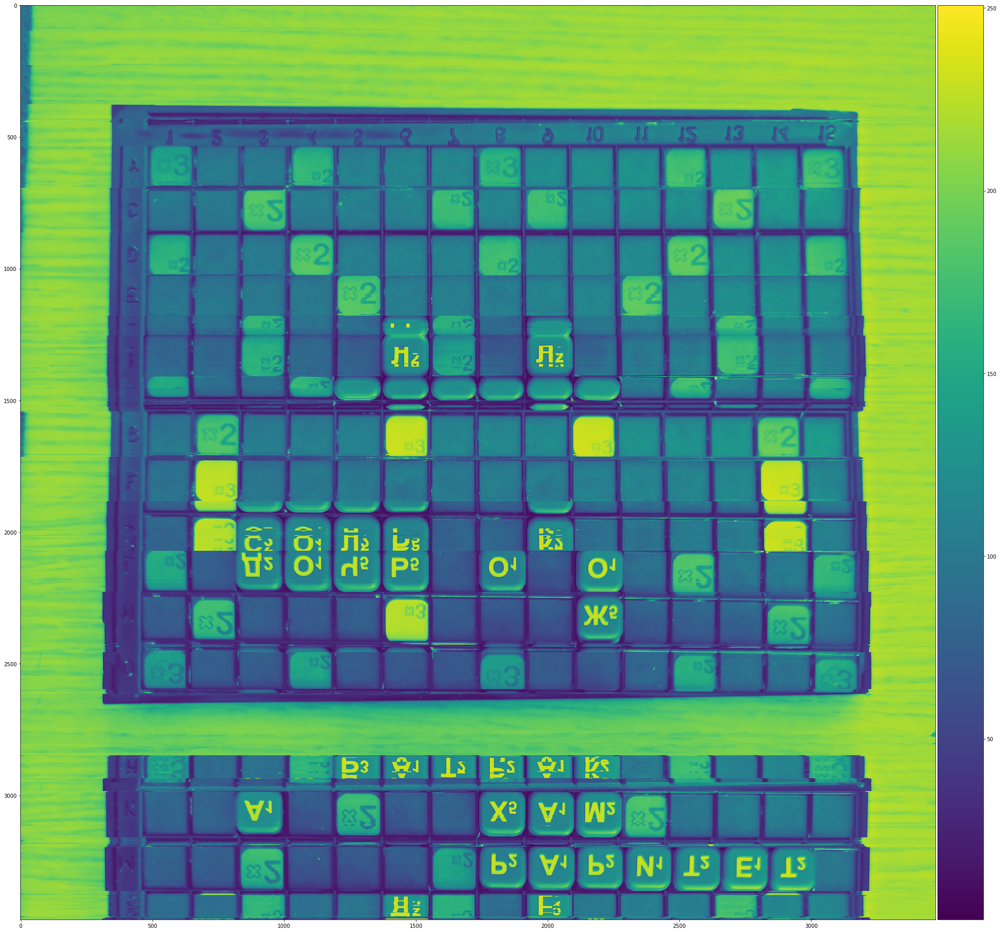

In [73]:
imshow(img_recovered)

In [11]:
img_cus = IsoBlue(*LoadRGBchannels('../CV/test1.jpg'))

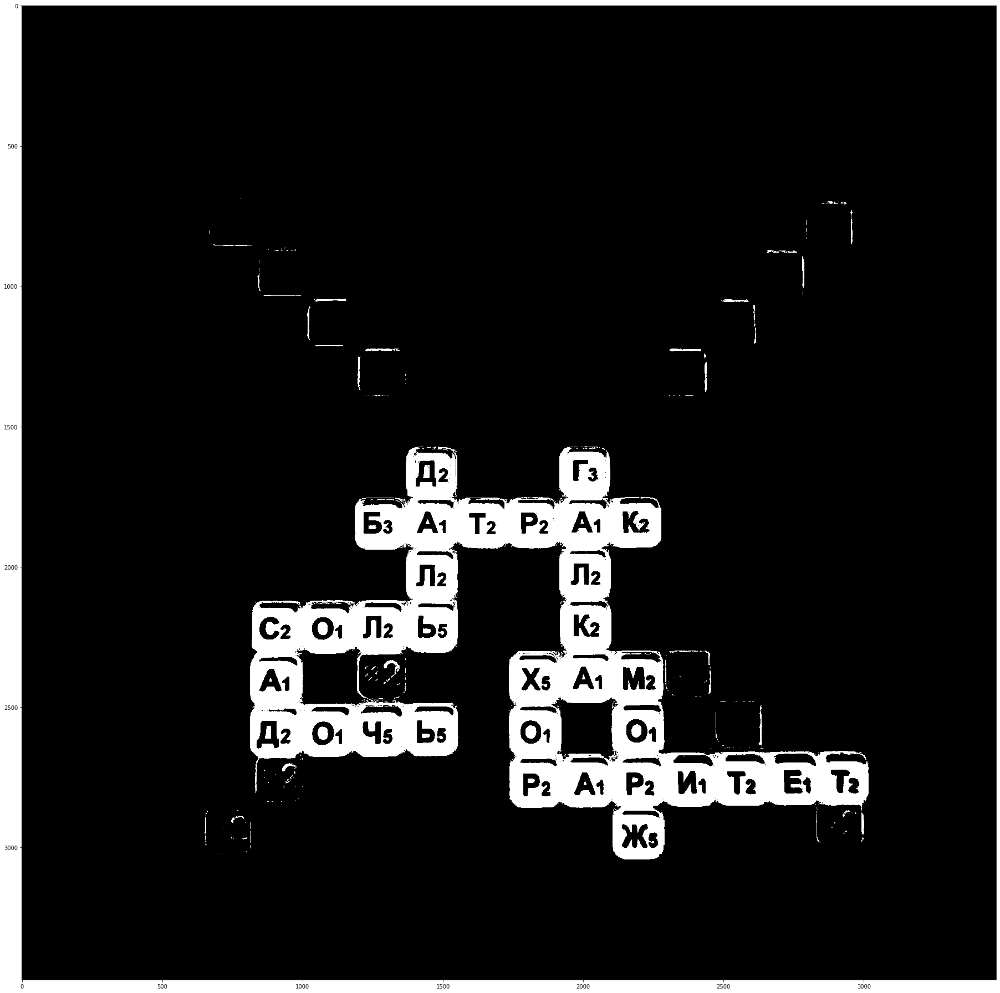

In [74]:
imshow(img_cus)

In [14]:
def ScrambleImage( fname ):
    mgdata = imageio.imread( fname, as_gray=True)
    sdata = mgdata + 0
    np.random.shuffle( sdata )
    dists = np.sqrt(((mgdata[0]-sdata).sum(1)))
    seedrow = (dists==0).nonzero()[0]
    return sdata, seedrow

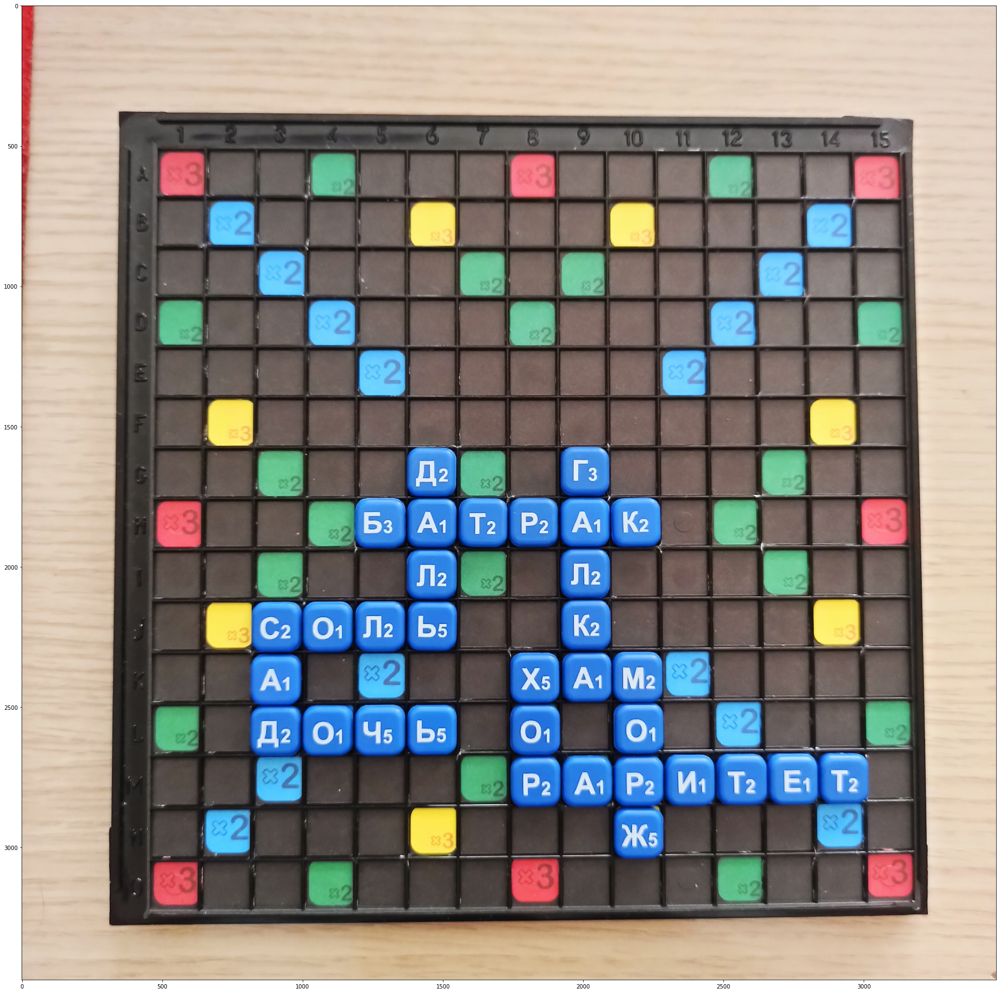

In [3]:
imshow(img)

In [ ]:
imshow(denoise_nl_means(img, patch_size=3))

In [14]:
imshow(threshold_local(img, block_size=3))

ValueError: The parameter `image` must be a 2-dimensional array

In [20]:
threshold_isodata(img)

140

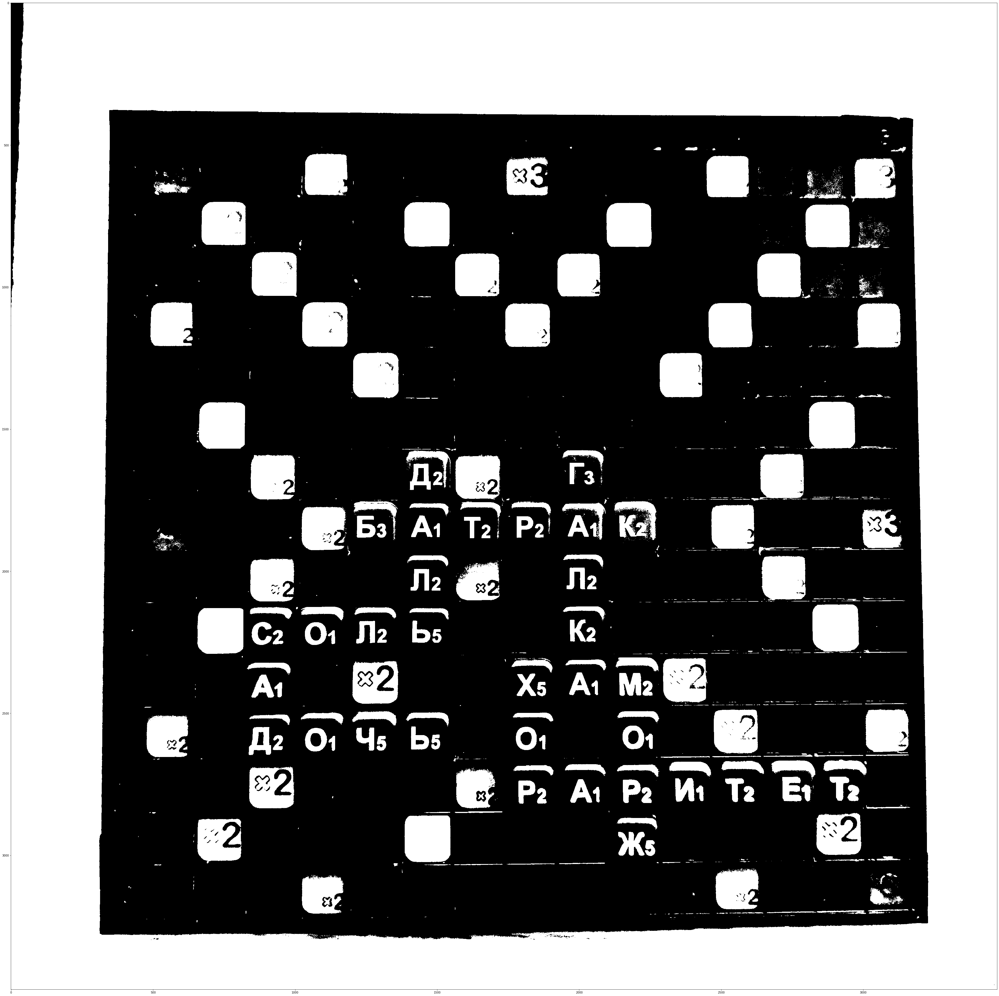

In [27]:
imshow(img_as_ubyte(rgb2gray(img)) > 140)